## Overall Methodology

### Training
- Read the image from dataset.
- Convert the big single image into multiple small images.
- Implement an autoencoder containing an encoder to produce the encoded vector and a decoder to build the image back from the encoded vector.
- Use all normal images from the last step to train the autoencoder.
- Use the encoded vector to train the Kernel density estimation.
- Calculate mean reconstruction error for both normal and anomaly images.
- Calculate mean density score for both normal and anomaly images.

### Prediction
- Read the image from dataset.
- Convert the big single image into multiple small images.
- Calculate reconstruction error using autoencoder.
- Calculate density score using autoencoder.
- Classify normal/anomaly based on the reconstruction error and density score

## Steps
1. Setup
2. Create Patches/small part of images
3. Train test split
4. Define data generators
5. Implement Model
6. Find reconstruction error for normal and anomaly
7. Find kernel density estimation for normal and anomaly
8. Prediction
9. Save prediction
10. Challenges
11. Further Improvements/Next Steps

## 1. Setup

In [1]:
import numpy as np
from patchify import patchify, unpatchify
import cv2
import os
import shutil

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import random
from sklearn.neighbors import KernelDensity

In [108]:
DATA_PATH = r'E:\extend-ai-ml-assessment\data'
PATCH_SIZE_H = 128
PATCH_SIZE_W = 128
file_names = [i for i in os.listdir(DATA_PATH) if '.jpg' in i]

## 2. Create Patches/small part of images

In [3]:
def copyingPatches(patches_img, img_name, folder='patches'):
    # save patches in the defined folder
    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            single_patch_img = patches_img[i, j, 0, :, :, :]
            os.makedirs(os.path.join(DATA_PATH, folder), exist_ok=True)
            cv2.imwrite(os.path.join(DATA_PATH, folder, f'{img_name}_' + '_'+ str(i).zfill(2) + '_' + str(j).zfill(2) + '.png'), single_patch_img)  # Save as PNG, not JPEG for keeping the quality.

In [4]:
# create patches
for name in file_names:
    img = cv2.imread(os.path.join(DATA_PATH, name))
#     print(img.shape)
    SIZE_X = (img.shape[1]//PATCH_SIZE_W)*PATCH_SIZE_W #Nearest size divisible by our patch size
    SIZE_Y = (img.shape[0]//PATCH_SIZE_H)*PATCH_SIZE_H #Nearest size divisible by our patch size
    img=cv2.resize(img,(SIZE_X,SIZE_Y))
    
    patches_img = patchify(img, (PATCH_SIZE_H, PATCH_SIZE_W, 3), step=PATCH_SIZE_H)
    copyingPatches(patches_img, name)

## 3. Train test split

In [5]:
# create train and val directories
ROOT= os.path.join(DATA_PATH, 'patches') #path of the original folder
TRAIN_PATH = os.path.join(DATA_PATH, 'train')
VAL_PATH = os.path.join(DATA_PATH, 'val')
ANAM_PATH = os.path.join(DATA_PATH, 'anomalies') 

os.makedirs(os.path.join(DATA_PATH, 'train', 'images'), exist_ok=True)

os.makedirs(os.path.join(DATA_PATH, 'val', 'images'), exist_ok=True)

# Split the patches into train and test
file_names = os.listdir(ROOT)
np.random.shuffle(file_names)
test_ratio = 0.15
train_file_names, test_file_names = np.split(np.array(file_names),
                                                      [int(len(file_names)* (1 - test_ratio))])
train_file_names = [os.path.join(ROOT, name) for name in train_file_names.tolist()]
test_file_names = [os.path.join(ROOT, name) for name in test_file_names.tolist()]

for name in train_file_names:
    shutil.copy(name, os.path.join(TRAIN_PATH, 'images'))

for name in test_file_names:
    shutil.copy(name, os.path.join(VAL_PATH, 'images'))

## 4. Define data generators

In [56]:
#Size of our input images
SIZE = 128

#Define generators for training, validation and anomaly data.

# Use data augmentation
batch_size = 64
datagen = ImageDataGenerator(rescale=1./255,
                            rotation_range=40,
                            width_shift_range=0.2,
                            height_shift_range=0.2,
                            shear_range=0.2,
                            zoom_range=0.2,
                            vertical_flip = True,
                            horizontal_flip=True)

train_generator = datagen.flow_from_directory(
    TRAIN_PATH,
    target_size=(SIZE, SIZE),
    batch_size=batch_size,
    class_mode='input'
    )

validation_generator = datagen.flow_from_directory(
    VAL_PATH,
    target_size=(SIZE, SIZE),
    batch_size=batch_size,
    class_mode='input'
    )

anomaly_generator = datagen.flow_from_directory(
    ANAM_PATH,
    target_size=(SIZE, SIZE),
    batch_size=batch_size,
    class_mode='input'
    )

Found 2055 images belonging to 1 classes.
Found 581 images belonging to 1 classes.
Found 61 images belonging to 1 classes.


## 5. Implement Model

In [57]:
#Define the autoencoder. 

#Encoder
model = Sequential()
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(SIZE, SIZE, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D((2, 2)))

#Decoder
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(UpSampling2D((2, 2)))

model.add(Conv2D(3, (3, 3), activation='sigmoid', padding='same'))

model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 128, 128, 64)      1792      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 64, 64, 64)       0         
 2D)                                                             
                                                                 
 conv2d_22 (Conv2D)          (None, 64, 64, 32)        18464     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 32, 32, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_23 (Conv2D)          (None, 32, 32, 16)        4624      
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 16, 16, 16)      

In [58]:
# Early stopping based on the val loss
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=100)

#Fit the model. 
history = model.fit(
        train_generator,
        epochs=1000,
        validation_data=validation_generator,
        shuffle = True,
        callbacks=[callback])
model.save('anamoly_detector.h5')

Epoch 1/1000
33/33 [==============================] - 10s 285ms/step - loss: 0.0241 - mse: 0.0241 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 2/1000
33/33 [==============================] - 9s 271ms/step - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 3/1000
33/33 [==============================] - 9s 265ms/step - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 4/1000
33/33 [==============================] - 9s 265ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 5/1000
33/33 [==============================] - 9s 261ms/step - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 6/1000
33/33 [==============================] - 9s 259ms/step - loss: 0.0029 - mse: 0.0029 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 7/1000
33/33 [==============================] - 9s 260ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0019 - val_mse: 0.0019
Epoch 8/1000
33/33 [==============================] - 9s 260m

Epoch 62/1000
33/33 [==============================] - 9s 266ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 63/1000
33/33 [==============================] - 9s 262ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 64/1000
33/33 [==============================] - 9s 265ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 65/1000
33/33 [==============================] - 9s 266ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 66/1000
33/33 [==============================] - 9s 270ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 67/1000
33/33 [==============================] - 9s 260ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 68/1000
33/33 [==============================] - 9s 265ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0011 - val_mse: 0.0011
Epoch 69/1000
33/33 [==============================] - 

33/33 [==============================] - 9s 267ms/step - loss: 9.8260e-04 - mse: 9.8260e-04 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 122/1000
33/33 [==============================] - 9s 263ms/step - loss: 9.4585e-04 - mse: 9.4585e-04 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 123/1000
33/33 [==============================] - 9s 261ms/step - loss: 9.6647e-04 - mse: 9.6647e-04 - val_loss: 9.5057e-04 - val_mse: 9.5057e-04
Epoch 124/1000
33/33 [==============================] - 9s 260ms/step - loss: 9.5109e-04 - mse: 9.5109e-04 - val_loss: 9.6327e-04 - val_mse: 9.6327e-04
Epoch 125/1000
33/33 [==============================] - 9s 263ms/step - loss: 9.7235e-04 - mse: 9.7235e-04 - val_loss: 9.7561e-04 - val_mse: 9.7561e-04
Epoch 126/1000
33/33 [==============================] - 9s 264ms/step - loss: 9.5624e-04 - mse: 9.5624e-04 - val_loss: 9.7321e-04 - val_mse: 9.7321e-04
Epoch 127/1000
33/33 [==============================] - 9s 263ms/step - loss: 9.8534e-04 - mse: 9.8534e-04 - val_loss: 

33/33 [==============================] - 9s 273ms/step - loss: 8.6755e-04 - mse: 8.6755e-04 - val_loss: 8.7652e-04 - val_mse: 8.7652e-04
Epoch 176/1000
33/33 [==============================] - 9s 263ms/step - loss: 8.6544e-04 - mse: 8.6544e-04 - val_loss: 9.2787e-04 - val_mse: 9.2787e-04
Epoch 177/1000
33/33 [==============================] - 9s 262ms/step - loss: 8.8501e-04 - mse: 8.8501e-04 - val_loss: 8.9571e-04 - val_mse: 8.9571e-04
Epoch 178/1000
33/33 [==============================] - 9s 271ms/step - loss: 8.8553e-04 - mse: 8.8553e-04 - val_loss: 9.6166e-04 - val_mse: 9.6166e-04
Epoch 179/1000
33/33 [==============================] - 9s 263ms/step - loss: 8.9635e-04 - mse: 8.9635e-04 - val_loss: 8.9129e-04 - val_mse: 8.9129e-04
Epoch 180/1000
33/33 [==============================] - 9s 261ms/step - loss: 8.6659e-04 - mse: 8.6659e-04 - val_loss: 8.7128e-04 - val_mse: 8.7128e-04
Epoch 181/1000
33/33 [==============================] - 9s 262ms/step - loss: 8.6804e-04 - mse: 8.6804e

33/33 [==============================] - 9s 264ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0010 - val_mse: 0.0010
Epoch 230/1000
33/33 [==============================] - 9s 271ms/step - loss: 9.2534e-04 - mse: 9.2534e-04 - val_loss: 8.7992e-04 - val_mse: 8.7992e-04
Epoch 231/1000
33/33 [==============================] - 9s 262ms/step - loss: 8.4740e-04 - mse: 8.4740e-04 - val_loss: 8.5043e-04 - val_mse: 8.5043e-04
Epoch 232/1000
33/33 [==============================] - 9s 262ms/step - loss: 8.2479e-04 - mse: 8.2479e-04 - val_loss: 8.2590e-04 - val_mse: 8.2590e-04
Epoch 233/1000
33/33 [==============================] - 9s 261ms/step - loss: 8.1715e-04 - mse: 8.1715e-04 - val_loss: 8.4116e-04 - val_mse: 8.4116e-04
Epoch 234/1000
33/33 [==============================] - 9s 264ms/step - loss: 8.0781e-04 - mse: 8.0781e-04 - val_loss: 8.2718e-04 - val_mse: 8.2718e-04
Epoch 235/1000
33/33 [==============================] - 9s 260ms/step - loss: 8.1292e-04 - mse: 8.1292e-04 - val_loss: 

33/33 [==============================] - 9s 263ms/step - loss: 7.5672e-04 - mse: 7.5672e-04 - val_loss: 7.6415e-04 - val_mse: 7.6415e-04
Epoch 284/1000
33/33 [==============================] - 9s 269ms/step - loss: 7.4674e-04 - mse: 7.4674e-04 - val_loss: 7.6844e-04 - val_mse: 7.6844e-04
Epoch 285/1000
33/33 [==============================] - 9s 269ms/step - loss: 7.6098e-04 - mse: 7.6098e-04 - val_loss: 7.6908e-04 - val_mse: 7.6908e-04
Epoch 286/1000
33/33 [==============================] - 9s 260ms/step - loss: 7.6292e-04 - mse: 7.6292e-04 - val_loss: 9.4334e-04 - val_mse: 9.4334e-04
Epoch 287/1000
33/33 [==============================] - 9s 266ms/step - loss: 7.5431e-04 - mse: 7.5431e-04 - val_loss: 7.6453e-04 - val_mse: 7.6453e-04
Epoch 288/1000
33/33 [==============================] - 9s 260ms/step - loss: 7.4137e-04 - mse: 7.4137e-04 - val_loss: 7.5311e-04 - val_mse: 7.5311e-04
Epoch 289/1000
33/33 [==============================] - 9s 262ms/step - loss: 7.5334e-04 - mse: 7.5334e

Epoch 337/1000
33/33 [==============================] - 9s 262ms/step - loss: 8.0562e-04 - mse: 8.0562e-04 - val_loss: 7.6807e-04 - val_mse: 7.6807e-04
Epoch 338/1000
33/33 [==============================] - 9s 264ms/step - loss: 7.0611e-04 - mse: 7.0611e-04 - val_loss: 7.2048e-04 - val_mse: 7.2048e-04
Epoch 339/1000
33/33 [==============================] - 9s 265ms/step - loss: 7.0092e-04 - mse: 7.0092e-04 - val_loss: 7.1398e-04 - val_mse: 7.1398e-04
Epoch 340/1000
33/33 [==============================] - 9s 267ms/step - loss: 6.9241e-04 - mse: 6.9241e-04 - val_loss: 7.1411e-04 - val_mse: 7.1411e-04
Epoch 341/1000
33/33 [==============================] - 9s 271ms/step - loss: 7.0448e-04 - mse: 7.0448e-04 - val_loss: 7.2228e-04 - val_mse: 7.2228e-04
Epoch 342/1000
33/33 [==============================] - 9s 261ms/step - loss: 6.9161e-04 - mse: 6.9161e-04 - val_loss: 6.9597e-04 - val_mse: 6.9597e-04
Epoch 343/1000
33/33 [==============================] - 9s 263ms/step - loss: 7.0090e-04

Epoch 391/1000
33/33 [==============================] - 9s 261ms/step - loss: 6.8495e-04 - mse: 6.8495e-04 - val_loss: 6.8876e-04 - val_mse: 6.8876e-04
Epoch 392/1000
33/33 [==============================] - 9s 263ms/step - loss: 6.5720e-04 - mse: 6.5720e-04 - val_loss: 6.6375e-04 - val_mse: 6.6375e-04
Epoch 393/1000
33/33 [==============================] - 9s 263ms/step - loss: 6.8756e-04 - mse: 6.8756e-04 - val_loss: 6.8363e-04 - val_mse: 6.8363e-04
Epoch 394/1000
33/33 [==============================] - 9s 269ms/step - loss: 6.5972e-04 - mse: 6.5972e-04 - val_loss: 6.9521e-04 - val_mse: 6.9521e-04
Epoch 395/1000
33/33 [==============================] - 9s 264ms/step - loss: 6.6938e-04 - mse: 6.6938e-04 - val_loss: 6.6739e-04 - val_mse: 6.6739e-04
Epoch 396/1000
33/33 [==============================] - 9s 261ms/step - loss: 6.5991e-04 - mse: 6.5991e-04 - val_loss: 6.5892e-04 - val_mse: 6.5892e-04
Epoch 397/1000
33/33 [==============================] - 9s 263ms/step - loss: 6.7191e-04

Epoch 445/1000
33/33 [==============================] - 9s 265ms/step - loss: 6.3123e-04 - mse: 6.3123e-04 - val_loss: 6.6947e-04 - val_mse: 6.6947e-04
Epoch 446/1000
33/33 [==============================] - 9s 266ms/step - loss: 6.3185e-04 - mse: 6.3185e-04 - val_loss: 6.5453e-04 - val_mse: 6.5453e-04
Epoch 447/1000
33/33 [==============================] - 9s 273ms/step - loss: 6.6585e-04 - mse: 6.6585e-04 - val_loss: 6.5101e-04 - val_mse: 6.5101e-04
Epoch 448/1000
33/33 [==============================] - 9s 265ms/step - loss: 6.3050e-04 - mse: 6.3050e-04 - val_loss: 6.4471e-04 - val_mse: 6.4471e-04
Epoch 449/1000
33/33 [==============================] - 9s 266ms/step - loss: 6.3795e-04 - mse: 6.3795e-04 - val_loss: 6.3881e-04 - val_mse: 6.3881e-04
Epoch 450/1000
33/33 [==============================] - 9s 266ms/step - loss: 6.4969e-04 - mse: 6.4969e-04 - val_loss: 6.7407e-04 - val_mse: 6.7407e-04
Epoch 451/1000
33/33 [==============================] - 9s 264ms/step - loss: 6.3307e-04

Epoch 499/1000
33/33 [==============================] - 9s 263ms/step - loss: 6.2328e-04 - mse: 6.2328e-04 - val_loss: 6.3564e-04 - val_mse: 6.3564e-04
Epoch 500/1000
33/33 [==============================] - 9s 263ms/step - loss: 6.1222e-04 - mse: 6.1222e-04 - val_loss: 6.1449e-04 - val_mse: 6.1449e-04
Epoch 501/1000
33/33 [==============================] - 9s 261ms/step - loss: 6.1020e-04 - mse: 6.1020e-04 - val_loss: 6.3881e-04 - val_mse: 6.3881e-04
Epoch 502/1000
33/33 [==============================] - 9s 263ms/step - loss: 6.1525e-04 - mse: 6.1525e-04 - val_loss: 6.3625e-04 - val_mse: 6.3625e-04
Epoch 503/1000
33/33 [==============================] - 9s 267ms/step - loss: 6.0845e-04 - mse: 6.0845e-04 - val_loss: 6.1180e-04 - val_mse: 6.1180e-04
Epoch 504/1000
33/33 [==============================] - 9s 262ms/step - loss: 6.2367e-04 - mse: 6.2367e-04 - val_loss: 6.9476e-04 - val_mse: 6.9476e-04
Epoch 505/1000
33/33 [==============================] - 9s 262ms/step - loss: 6.1243e-04

Epoch 553/1000
33/33 [==============================] - 9s 262ms/step - loss: 6.0057e-04 - mse: 6.0057e-04 - val_loss: 5.9988e-04 - val_mse: 5.9988e-04
Epoch 554/1000
33/33 [==============================] - 9s 262ms/step - loss: 5.9587e-04 - mse: 5.9587e-04 - val_loss: 6.2424e-04 - val_mse: 6.2424e-04
Epoch 555/1000
33/33 [==============================] - 9s 262ms/step - loss: 5.9241e-04 - mse: 5.9241e-04 - val_loss: 6.0527e-04 - val_mse: 6.0527e-04
Epoch 556/1000
33/33 [==============================] - 9s 263ms/step - loss: 5.9722e-04 - mse: 5.9722e-04 - val_loss: 6.0234e-04 - val_mse: 6.0234e-04
Epoch 557/1000
33/33 [==============================] - 9s 266ms/step - loss: 5.9379e-04 - mse: 5.9379e-04 - val_loss: 6.3334e-04 - val_mse: 6.3334e-04
Epoch 558/1000
33/33 [==============================] - 9s 268ms/step - loss: 5.9726e-04 - mse: 5.9726e-04 - val_loss: 6.1009e-04 - val_mse: 6.1009e-04
Epoch 559/1000
33/33 [==============================] - 9s 264ms/step - loss: 6.0012e-04

Epoch 607/1000
33/33 [==============================] - 9s 262ms/step - loss: 5.7141e-04 - mse: 5.7141e-04 - val_loss: 5.9557e-04 - val_mse: 5.9557e-04
Epoch 608/1000
33/33 [==============================] - 9s 264ms/step - loss: 6.2371e-04 - mse: 6.2371e-04 - val_loss: 6.5970e-04 - val_mse: 6.5970e-04
Epoch 609/1000
33/33 [==============================] - 9s 270ms/step - loss: 5.8915e-04 - mse: 5.8915e-04 - val_loss: 5.9621e-04 - val_mse: 5.9621e-04
Epoch 610/1000
33/33 [==============================] - 9s 262ms/step - loss: 5.8346e-04 - mse: 5.8346e-04 - val_loss: 6.0057e-04 - val_mse: 6.0057e-04
Epoch 611/1000
33/33 [==============================] - 9s 264ms/step - loss: 5.7631e-04 - mse: 5.7631e-04 - val_loss: 5.9030e-04 - val_mse: 5.9030e-04
Epoch 612/1000
33/33 [==============================] - 9s 267ms/step - loss: 5.8055e-04 - mse: 5.8055e-04 - val_loss: 6.0284e-04 - val_mse: 6.0284e-04
Epoch 613/1000
33/33 [==============================] - 9s 268ms/step - loss: 5.8718e-04

Epoch 661/1000
33/33 [==============================] - 9s 264ms/step - loss: 6.0352e-04 - mse: 6.0352e-04 - val_loss: 5.9817e-04 - val_mse: 5.9817e-04
Epoch 662/1000
33/33 [==============================] - 9s 268ms/step - loss: 5.9422e-04 - mse: 5.9422e-04 - val_loss: 5.9576e-04 - val_mse: 5.9576e-04
Epoch 663/1000
33/33 [==============================] - 9s 260ms/step - loss: 5.5550e-04 - mse: 5.5550e-04 - val_loss: 5.5947e-04 - val_mse: 5.5947e-04
Epoch 664/1000
33/33 [==============================] - 9s 263ms/step - loss: 5.5682e-04 - mse: 5.5682e-04 - val_loss: 5.9984e-04 - val_mse: 5.9984e-04
Epoch 665/1000
33/33 [==============================] - 9s 263ms/step - loss: 5.5875e-04 - mse: 5.5875e-04 - val_loss: 5.7449e-04 - val_mse: 5.7449e-04
Epoch 666/1000
33/33 [==============================] - 9s 264ms/step - loss: 5.4855e-04 - mse: 5.4855e-04 - val_loss: 5.8650e-04 - val_mse: 5.8650e-04
Epoch 667/1000
33/33 [==============================] - 9s 267ms/step - loss: 5.6912e-04

Epoch 715/1000
33/33 [==============================] - 9s 268ms/step - loss: 5.5225e-04 - mse: 5.5225e-04 - val_loss: 5.6760e-04 - val_mse: 5.6760e-04
Epoch 716/1000
33/33 [==============================] - 9s 265ms/step - loss: 5.5319e-04 - mse: 5.5319e-04 - val_loss: 6.6637e-04 - val_mse: 6.6637e-04
Epoch 717/1000
33/33 [==============================] - 9s 275ms/step - loss: 5.8140e-04 - mse: 5.8140e-04 - val_loss: 5.9307e-04 - val_mse: 5.9307e-04
Epoch 718/1000
33/33 [==============================] - 9s 262ms/step - loss: 5.5639e-04 - mse: 5.5639e-04 - val_loss: 5.6183e-04 - val_mse: 5.6183e-04
Epoch 719/1000
33/33 [==============================] - 9s 265ms/step - loss: 5.4499e-04 - mse: 5.4499e-04 - val_loss: 5.5637e-04 - val_mse: 5.5637e-04
Epoch 720/1000
33/33 [==============================] - 9s 264ms/step - loss: 5.6116e-04 - mse: 5.6116e-04 - val_loss: 6.2539e-04 - val_mse: 6.2539e-04
Epoch 721/1000
33/33 [==============================] - 9s 263ms/step - loss: 5.5201e-04

Epoch 769/1000
33/33 [==============================] - 9s 262ms/step - loss: 5.6996e-04 - mse: 5.6996e-04 - val_loss: 5.8014e-04 - val_mse: 5.8014e-04
Epoch 770/1000
33/33 [==============================] - 9s 271ms/step - loss: 5.6402e-04 - mse: 5.6402e-04 - val_loss: 5.5926e-04 - val_mse: 5.5926e-04
Epoch 771/1000
33/33 [==============================] - 9s 263ms/step - loss: 5.4598e-04 - mse: 5.4598e-04 - val_loss: 5.5792e-04 - val_mse: 5.5792e-04
Epoch 772/1000
33/33 [==============================] - 9s 264ms/step - loss: 5.3376e-04 - mse: 5.3376e-04 - val_loss: 5.5133e-04 - val_mse: 5.5133e-04
Epoch 773/1000
33/33 [==============================] - 9s 261ms/step - loss: 5.3618e-04 - mse: 5.3618e-04 - val_loss: 5.5917e-04 - val_mse: 5.5917e-04
Epoch 774/1000
33/33 [==============================] - 9s 260ms/step - loss: 5.4338e-04 - mse: 5.4338e-04 - val_loss: 5.5795e-04 - val_mse: 5.5795e-04
Epoch 775/1000
33/33 [==============================] - 9s 262ms/step - loss: 5.6719e-04

Epoch 823/1000
33/33 [==============================] - 9s 264ms/step - loss: 5.3259e-04 - mse: 5.3259e-04 - val_loss: 5.4293e-04 - val_mse: 5.4293e-04
Epoch 824/1000
33/33 [==============================] - 9s 268ms/step - loss: 5.2734e-04 - mse: 5.2734e-04 - val_loss: 5.3996e-04 - val_mse: 5.3996e-04
Epoch 825/1000
33/33 [==============================] - 9s 261ms/step - loss: 5.2304e-04 - mse: 5.2304e-04 - val_loss: 5.2812e-04 - val_mse: 5.2812e-04
Epoch 826/1000
33/33 [==============================] - 9s 263ms/step - loss: 5.3099e-04 - mse: 5.3099e-04 - val_loss: 5.6238e-04 - val_mse: 5.6238e-04
Epoch 827/1000
33/33 [==============================] - 9s 262ms/step - loss: 5.3626e-04 - mse: 5.3626e-04 - val_loss: 5.3740e-04 - val_mse: 5.3740e-04
Epoch 828/1000
33/33 [==============================] - 9s 262ms/step - loss: 5.2751e-04 - mse: 5.2751e-04 - val_loss: 5.3764e-04 - val_mse: 5.3764e-04
Epoch 829/1000
33/33 [==============================] - 9s 263ms/step - loss: 5.3175e-04

Epoch 877/1000
33/33 [==============================] - 9s 263ms/step - loss: 5.3429e-04 - mse: 5.3429e-04 - val_loss: 5.1506e-04 - val_mse: 5.1506e-04
Epoch 878/1000
33/33 [==============================] - 9s 267ms/step - loss: 5.3502e-04 - mse: 5.3502e-04 - val_loss: 5.3726e-04 - val_mse: 5.3726e-04
Epoch 879/1000
33/33 [==============================] - 9s 260ms/step - loss: 5.2070e-04 - mse: 5.2070e-04 - val_loss: 5.4781e-04 - val_mse: 5.4781e-04
Epoch 880/1000
33/33 [==============================] - 9s 269ms/step - loss: 5.4567e-04 - mse: 5.4567e-04 - val_loss: 5.5467e-04 - val_mse: 5.5467e-04
Epoch 881/1000
33/33 [==============================] - 9s 263ms/step - loss: 5.3045e-04 - mse: 5.3045e-04 - val_loss: 5.3445e-04 - val_mse: 5.3445e-04
Epoch 882/1000
33/33 [==============================] - 9s 259ms/step - loss: 5.3519e-04 - mse: 5.3519e-04 - val_loss: 5.6835e-04 - val_mse: 5.6835e-04
Epoch 883/1000
33/33 [==============================] - 9s 263ms/step - loss: 5.2239e-04

Epoch 931/1000
33/33 [==============================] - 9s 262ms/step - loss: 5.1394e-04 - mse: 5.1394e-04 - val_loss: 5.6075e-04 - val_mse: 5.6075e-04
Epoch 932/1000
33/33 [==============================] - 9s 263ms/step - loss: 5.1690e-04 - mse: 5.1690e-04 - val_loss: 5.3579e-04 - val_mse: 5.3579e-04
Epoch 933/1000
33/33 [==============================] - 9s 268ms/step - loss: 5.1825e-04 - mse: 5.1825e-04 - val_loss: 5.2889e-04 - val_mse: 5.2889e-04
Epoch 934/1000
33/33 [==============================] - 9s 262ms/step - loss: 5.1649e-04 - mse: 5.1649e-04 - val_loss: 5.2811e-04 - val_mse: 5.2811e-04
Epoch 935/1000
33/33 [==============================] - 9s 262ms/step - loss: 5.3940e-04 - mse: 5.3940e-04 - val_loss: 5.8109e-04 - val_mse: 5.8109e-04
Epoch 936/1000
33/33 [==============================] - 9s 261ms/step - loss: 5.2781e-04 - mse: 5.2781e-04 - val_loss: 5.2746e-04 - val_mse: 5.2746e-04
Epoch 937/1000
33/33 [==============================] - 9s 263ms/step - loss: 5.3387e-04

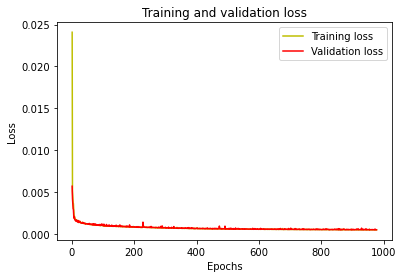

In [59]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [60]:
# Get all batches generated by the datagen and pick a batch for prediction
# to test the model. 
data_batch = []  #Capture all training batches as a numpy array
img_num = 0
while img_num <= train_generator.batch_index:   #gets each generated batch of size batch_size
    data = train_generator.next()
    data_batch.append(data[0])
    img_num = img_num + 1

predicted = model.predict(data_batch[0])  #Predict on the first batch of images


2/2 [==============================] - 0s 164ms/step


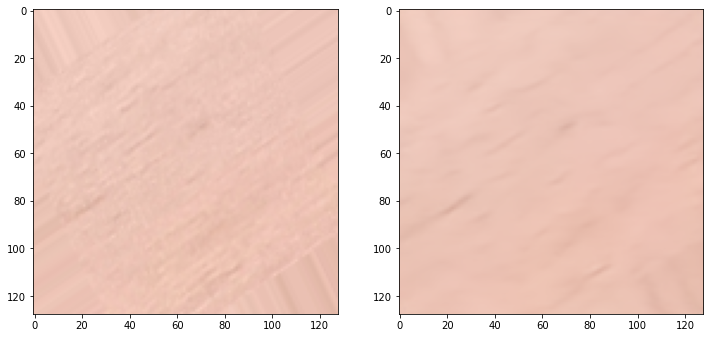

In [61]:
#Sanity check, view few images and corresponding reconstructions
image_number = random.randint(0, predicted.shape[0])
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(data_batch[0][image_number])
plt.subplot(122)
plt.imshow(predicted[image_number])
plt.show()

## 6. Find reconstruction error for normal and anomaly

In [93]:
# Examine the reconstruction error for our validation data and the anomaly images
validation_error = model.evaluate_generator(validation_generator)
anomaly_error = model.evaluate_generator(anomaly_generator)

print("Recon. error for the validation (normal) data is: ", validation_error)
print("Recon. error for the anomaly data is: ", anomaly_error)

C:\Users\14372\AppData\Local\Temp\ipykernel_19644\2468543786.py:3: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  validation_error = model.evaluate_generator(validation_generator)
C:\Users\14372\AppData\Local\Temp\ipykernel_19644\2468543786.py:4: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  anomaly_error = model.evaluate_generator(anomaly_generator)


Recon. error for the validation (normal) data is:  [0.0005037238006480038, 0.0005037238006480038]
Recon. error for the anomaly data is:  [0.0005082268617115915, 0.0005082268617115915]


Error is slightly large for the anomaly data

## 7. Find kernel density estimation for normal and anomaly

In [63]:
# Again build the encoder network, with same trained weights.
#This is used to get the compressed output (latent space) of the input image. 
#The compressed output is then used to calculate the KDE

encoder_model = Sequential()
encoder_model.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(SIZE, SIZE, 3), weights=model.layers[0].get_weights()) )
encoder_model.add(MaxPooling2D((2, 2), padding='same'))
encoder_model.add(Conv2D(32, (3, 3), activation='relu', padding='same', weights=model.layers[2].get_weights()))
encoder_model.add(MaxPooling2D((2, 2), padding='same'))
encoder_model.add(Conv2D(16, (3, 3), activation='relu', padding='same', weights=model.layers[4].get_weights()))
encoder_model.add(MaxPooling2D((2, 2), padding='same'))
encoder_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_28 (Conv2D)          (None, 128, 128, 64)      1792      
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 64, 64, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_29 (Conv2D)          (None, 64, 64, 32)        18464     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 32, 32, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_30 (Conv2D)          (None, 32, 32, 16)        4624      
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 16, 16, 16)      

In [94]:
# Encoded output of input images => Latent space
encoded_images = encoder_model.predict_generator(train_generator)

# Flatten the encoder output because KDE
encoder_output_shape = encoder_model.output_shape
out_vector_shape = encoder_output_shape[1]*encoder_output_shape[2]*encoder_output_shape[3]

encoded_images_vector = [np.reshape(img, (out_vector_shape)) for img in encoded_images]

#Fit KDE to the image latent data
kde = KernelDensity(kernel='gaussian', bandwidth=0.2).fit(encoded_images_vector)

C:\Users\14372\AppData\Local\Temp\ipykernel_19644\87809947.py:5: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  encoded_images = encoder_model.predict_generator(train_generator)


In [95]:
# Average and std dev. of density and recon. error for normal and anomaly images. 
train_batch = train_generator.next()[0]
anomaly_batch = anomaly_generator.next()[0]
normal_values = calc_density_and_recon_error(train_batch)
anomaly_values = calc_density_and_recon_error(anomaly_batch)

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 22ms/step - loss: 0.0013 - mse: 0.0013


In [96]:
print(f"normal_values: {normal_values}")
print(f"anomaly_values: {anomaly_values}")

normal_values: (2680.945821492354, 379.2981627837426, 0.0005434339205777856, 0.0005547672283680556)
anomaly_values: (2074.402145598982, 945.0624029100634, 0.0008722536066280944, 0.00046285176081625794)


In [97]:
import pickle

with open('kde.pickle', 'wb') as f:
    pickle.dump(kde, f)

## 8. Prediction

In [136]:
density_threshold = 2600 #Set this value based on the above exercise
reconstruction_error_threshold = 0.0005 # Set this value based on the above exercise
    
def predict(img, img_name):
    # Detect anomalies(knots, cracks, etc.) and put bounding box.
    
    img_orig = img.copy()
    anam_loc = []
    
    SIZE_X = (img.shape[1]//PATCH_SIZE_W)*PATCH_SIZE_W #Nearest size divisible by our patch size
    SIZE_Y = (img.shape[0]//PATCH_SIZE_H)*PATCH_SIZE_H #Nearest size divisible by our patch size
    img=cv2.resize(img,(SIZE_X,SIZE_Y))
    patches_img = patchify(img, (PATCH_SIZE_H, PATCH_SIZE_W, 3), step=PATCH_SIZE_H)
    copyingPatches(patches_img, img_name, 'predict_patches')
    
    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            img  = Image.open(os.path.join(DATA_PATH, 'predict_patches', f'{img_name}_' + '_'+ str(i).zfill(2) + '_' + str(j).zfill(2) + '.png'))
            img = np.array(img.resize((128,128), Image.Resampling.LANCZOS))
            img = img / 255.
            img = img[np.newaxis, :,:,:]
            encoded_img = encoder_model.predict([[img]]) 
            encoded_img = [np.reshape(img, (out_vector_shape)) for img in encoded_img] 
            density = kde.score_samples(encoded_img)[0] 

            reconstruction = model.predict([[img]])
            reconstruction_error = model.evaluate([reconstruction],[[img]], batch_size = 1)[0]
            
            
            if density < density_threshold or reconstruction_error > reconstruction_error_threshold:
                anam_loc.append([(j*PATCH_SIZE_H, i*PATCH_SIZE_H), (j*PATCH_SIZE_H + PATCH_SIZE_H, i*PATCH_SIZE_H + PATCH_SIZE_H)])
                
    for loc in anam_loc:
        img = cv2.rectangle(img_orig, loc[0], loc[1], (0, 0, 255), 4)

    return img

## 9. Save prediction

In [137]:
# Save prediction
file_names = [i for i in os.listdir(DATA_PATH) if '.jpg' in i]
for name in file_names:
    img = cv2.imread(os.path.join(DATA_PATH, name))
    img = predict(img, name)
    os.makedirs('predictions', exist_ok=True)
    cv2.imwrite(os.path.join('predictions', name.split('.jpg')[0] + '.png'), img)

1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 25ms/step - loss: 2.0589e-04 - mse: 2.0589e-04


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 25ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 24ms/step - loss: 4.7699e-04 - mse: 4.7699e-04


1/1 [==============================] - 0s 24ms/step - loss: 1.6821e-04 - mse: 1.6821e-04


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 24ms/step - loss: 1.5866e-04 - mse: 1.5866e-04


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 28ms/step - loss: 5.7465e-04 - mse: 5.7465e-04


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 24ms/step - loss: 5.1171e-05 - mse: 5.1171e-05


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 21ms/step - loss: 2.4416e-04 - mse: 2.4416e-04


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 23ms/step - loss: 1.4390e-04 - mse: 1.4390e-04


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 22ms/step - loss: 1.7647e-04 - mse: 1.7647e-04


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 25ms/step - loss: 2.5188e-04 - mse: 2.5188e-04


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 24ms/step - loss: 2.0480e-04 - mse: 2.0480e-04


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 14ms/step


1/1 [==============================] - 0s 13ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 22ms/step - loss: 4.4653e-04 - mse: 4.4653e-04


### 9.1 Prediction Samples

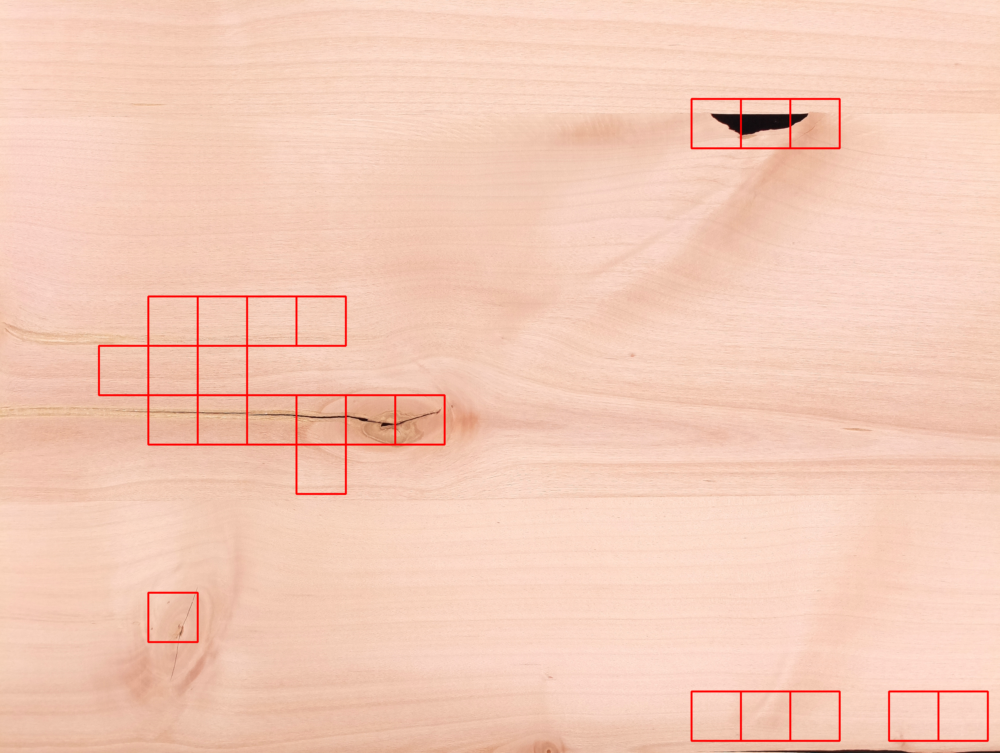

In [140]:
file_names = [i for i in os.listdir('predictions') if '.png' in i]

img  = Image.open(os.path.join('predictions', file_names[5]))
img

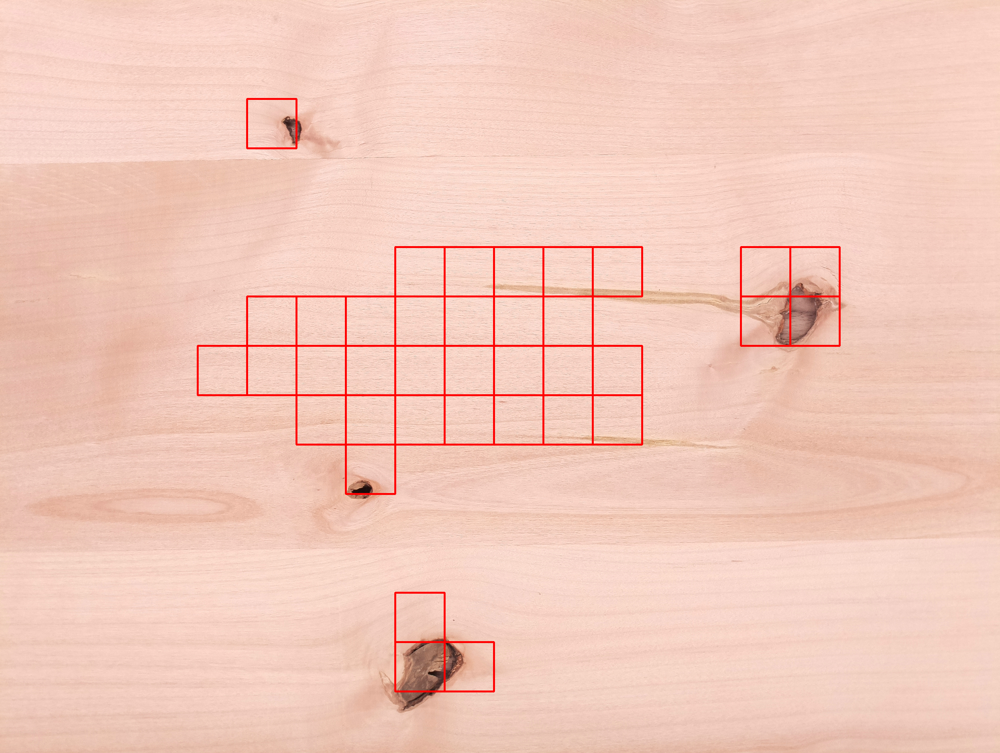

In [138]:
file_names = [i for i in os.listdir('predictions') if '.png' in i]

img  = Image.open(os.path.join('predictions', file_names[2]))
img

## 10. Challenges

1. Lesser amount of data
2. High number of false positives

## 11. Further Improvements

1. Improve model
    a. Transfer learning
    b. Implement complex model
2. Try to collect new data, if not possible, generate artifical data 